In [4]:
import pandas as pd
import os
import matplotlib.pyplot as plt

In [5]:
# Data directroy 
os.chdir(r"C:\Users\shubh\Work\CEM\EmissionComparison")

In [6]:
gcp_ff_data = pd.read_csv('GCP_FF_data.csv')
lulucf_data = pd.read_csv('LULUCF_data.csv')
primap_data = pd.read_csv('primap_data_co2emissions.csv')


In [7]:
# GCP_FF_data and LULUCF_data from MtC/yr to MtCO2/yr
gcp_ff_data.iloc[:, 1:] *= 3.664
lulucf_data.iloc[:, 1:] *= 3.664
# PRIMAP_data from GgCO2/year to GtCO2/year (1 Gt = 10^6 Gg)
primap_data.iloc[:, 8:] /= 1e6


In [8]:
# Melting the PRIMAP dataset
primap_data_melted = primap_data.melt(id_vars=['country_name', 'category (IPCC2006_PRIMAP)'], 
                                      value_vars=primap_data.columns[8:], 
                                      var_name='Year', 
                                      value_name='Emissions')
# Filtering for relevant categories and years (1850 to 2022)
primap_data_melted = primap_data_melted[primap_data_melted['category (IPCC2006_PRIMAP)'].isin(['M.0.EL', 'M.LULUCF'])]
primap_data_melted['Year'] = pd.to_numeric(primap_data_melted['Year'])
primap_data_melted = primap_data_melted[(primap_data_melted['Year'] >= 1850) & (primap_data_melted['Year'] <= 2022)]
# Filtering the global data for Fossil Fuel and Industry (M.0.EL) and LULUCF (M.LULUCF) from the PRIMAP dataset
primap_global_ff = primap_data_melted[(primap_data_melted['country_name'] == 'Global') & 
                                                (primap_data_melted['category (IPCC2006_PRIMAP)'] == 'M.0.EL')]
primap_global_lulucf = primap_data_melted[(primap_data_melted['country_name'] == 'Global') & 
                                                    (primap_data_melted['category (IPCC2006_PRIMAP)'] == 'M.LULUCF')]



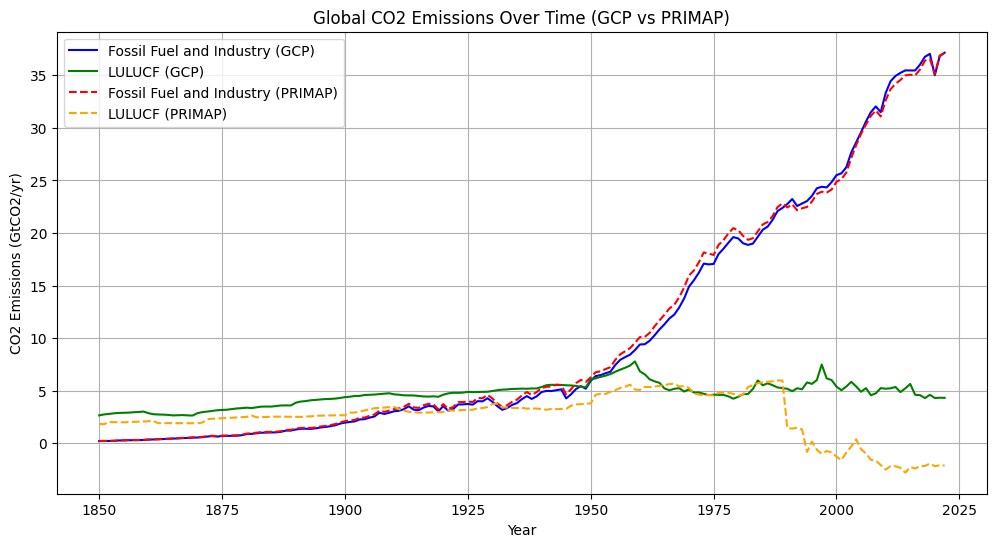

In [19]:
# Converting GCP data from MtCO2/yr to GtCO2/yr (1 Gt = 1e6 Mt)
global_gcp_ff = gcp_ff_data[['Year', 'Global']].dropna()
global_lulucf = lulucf_data[['Year', 'Global']].dropna()
global_gcp_ff['Global'] /= 1e3  # Converting to GtCO2/yr
global_lulucf['Global'] /= 1e3  # Converting to GtCO2/yr

# Plotting the combined time series
plt.figure(figsize=(12, 6))
plt.plot(global_gcp_ff['Year'], global_gcp_ff['Global'], label='Fossil Fuel and Industry (GCP)', color='blue')
plt.plot(global_lulucf['Year'], global_lulucf['Global'], label='LULUCF (GCP)', color='green')
plt.plot(primap_global_ff['Year'], primap_global_ff['Emissions'], label='Fossil Fuel and Industry (PRIMAP)', color='red', linestyle='dashed')
plt.plot(primap_global_lulucf['Year'], primap_global_lulucf['Emissions'], label='LULUCF (PRIMAP)', color='orange', linestyle='dashed')
plt.xlabel('Year')
plt.ylabel('CO2 Emissions (GtCO2/yr)')
plt.title('Global CO2 Emissions Over Time (GCP vs PRIMAP)')
plt.legend()
plt.grid(True)
plt.show()

In [21]:
import plotly.graph_objects as go

# Assuming gcp_ff_data, lulucf_data, and primap_data_melted are already correctly loaded and processed

def create_traces_for_country(country_name, df_gcp_ff, df_gcp_lulucf, df_primap_ff, df_primap_lulucf):
    traces = []

    # Check if country data is available in GCP FF dataset
    if country_name in df_gcp_ff.columns:
        gcp_ff_data = df_gcp_ff[['Year', country_name]].dropna().rename(columns={country_name: 'Emissions'})
        #gcp_ff_data['Emissions'] *= 3.664  # Convert from MtC/yr to MtCO2/yr
        gcp_ff_data['Emissions'] /= 1e3    # Convert from MtCO2/yr to GtCO2/yr
        trace_gcp_ff = go.Scatter(x=gcp_ff_data['Year'], y=gcp_ff_data['Emissions'],
                                  mode='lines', name=f'{country_name} - FF (GCP)',
                                  line=dict(color='blue'))
        traces.append(trace_gcp_ff)

    # Check if country data is available in GCP LULUCF dataset
    if country_name in df_gcp_lulucf.columns:
        gcp_lulucf_data = df_gcp_lulucf[['Year', country_name]].dropna().rename(columns={country_name: 'Emissions'})
        #gcp_lulucf_data['Emissions'] *= 3.664  # Convert from MtC/yr to MtCO2/yr
        gcp_lulucf_data['Emissions'] /= 1e3    # Convert from MtCO2/yr to GtCO2/yr
        trace_gcp_lulucf = go.Scatter(x=gcp_lulucf_data['Year'], y=gcp_lulucf_data['Emissions'],
                                      mode='lines', name=f'{country_name} - LULUCF (GCP)',
                                      line=dict(color='green'))
        traces.append(trace_gcp_lulucf)

    # PRIMAP Data
    primap_ff_data = df_primap_ff[df_primap_ff['country_name'] == country_name]
    trace_primap_ff = go.Scatter(x=primap_ff_data['Year'], y=primap_ff_data['Emissions'],
                                 mode='lines', name=f'{country_name} - FF (PRIMAP)',
                                 line=dict(color='red', dash='dash'))
    traces.append(trace_primap_ff)

    primap_lulucf_data = df_primap_lulucf[df_primap_lulucf['country_name'] == country_name]
    trace_primap_lulucf = go.Scatter(x=primap_lulucf_data['Year'], y=primap_lulucf_data['Emissions'],
                                     mode='lines', name=f'{country_name} - LULUCF (PRIMAP)',
                                     line=dict(color='orange', dash='dash'))
    traces.append(trace_primap_lulucf)

    return traces

# Combine unique country names from GCP and PRIMAP datasets
unique_countries_gcp_ff = list(gcp_ff_data.columns[1:])
unique_countries_gcp_lulucf = list(lulucf_data.columns[1:])
unique_countries_primap = primap_data_melted['country_name'].dropna().unique()
#unique_countries = list(set(unique_countries_gcp_ff + unique_countries_gcp_lulucf + list(unique_countries_primap)))
unique_countries = list(set(unique_countries_gcp_lulucf))

# Start with an empty figure
fig = go.Figure()

# Add traces for each country
for country in unique_countries:
    country_traces = create_traces_for_country(country, gcp_ff_data, lulucf_data, 
                                               primap_data_melted[primap_data_melted['category (IPCC2006_PRIMAP)'] == 'M.0.EL'],
                                               primap_data_melted[primap_data_melted['category (IPCC2006_PRIMAP)'] == 'M.LULUCF'])
    for trace in country_traces:
        fig.add_trace(trace)

# Make all traces invisible initially
for trace in fig.data:
    trace.visible = False

# Initialize the dictionary to hold the mapping
country_to_trace_indices = {}

# Add traces for each country and build the mapping
trace_index = 0  # Initialize trace index
for country in unique_countries:
    country_traces = create_traces_for_country(country, gcp_ff_data, lulucf_data, 
                                               primap_data_melted[primap_data_melted['category (IPCC2006_PRIMAP)'] == 'M.0.EL'],
                                               primap_data_melted[primap_data_melted['category (IPCC2006_PRIMAP)'] == 'M.LULUCF'])
    for trace in country_traces:
        fig.add_trace(trace)
        # Increase the trace index for each trace added
        trace_index += 1
    # After adding all traces for a country, store the range of indices
    country_to_trace_indices[country] = list(range(trace_index - len(country_traces), trace_index))

# Make all traces invisible initially
for trace in fig.data:
    trace.visible = False

# Now, create the dropdown buttons using the updated mapping
dropdown_buttons = []
for country, trace_indices in country_to_trace_indices.items():
    visibility = [False] * len(fig.data)
    for index in trace_indices:
        visibility[index] = True  # Set the correct visibility for each trace of the country

    button = dict(
        label=country,
        method="update",
        args=[{"visible": visibility},
              {"title": f"CO2 Emissions for {country}"}],
    )
    dropdown_buttons.append(button)

# Update the figure layout with the dropdown
fig.update_layout(
    updatemenus=[
        {
            "buttons": dropdown_buttons,
            "direction": "down",
            "showactive": True,
        }
    ],
    xaxis=dict(title='Year'),
    yaxis=dict(title='CO2 Emissions (GtCO2/yr)'),
    title=f"CO2 Emissions for {unique_countries[0]}"
)

# Set the initial visibility for the first country in the list
initial_country = unique_countries[0]
for index in country_to_trace_indices[initial_country]:
    fig.data[index].visible = True

# Show the figure
fig.show()


In [13]:
# Assuming gcp_ff_data, lulucf_data, and primap_data_melted are the dataframes already loaded with data.

# Let's create a function that will map each country to its corresponding traces in the figure.
def map_country_to_traces(unique_countries, fig_data):
    # Create a dictionary to map countries to trace indices
    country_to_trace_indices = {}
    for country in unique_countries:
        # Find the traces that correspond to the current country
        country_traces = [index for index, trace in enumerate(fig_data) if trace.name.startswith(f'{country} -')]
        country_to_trace_indices[country] = country_traces
    return country_to_trace_indices

# Now, let's use the function to map the countries to their traces
unique_countries_gcp_lulucf = list(lulucf_data.columns[1:])  # Assuming the first column is 'Year'
country_to_trace_indices = map_country_to_traces(unique_countries_gcp_lulucf, fig.data)

# Let's print out the mapping for the first few countries to check it
for country in list(country_to_trace_indices.keys())[:5]:  # Just as an example, let's look at the first 5 countries
    print(f"{country}: {country_to_trace_indices[country]}")

# If you want to check for a specific country, you can directly access it
country_check = 'Germany'  # Replace with the country you want to check
if country_check in country_to_trace_indices:
    print(f"{country_check}: {country_to_trace_indices[country_check]}")
else:
    print(f"No traces found for {country_check}")



Afghanistan: [303, 304, 305, 306]
Albania: [446, 447, 448, 449]
Algeria: [307, 308, 309, 310]
Andorra: [267, 268, 269, 270]
Angola: [733, 734, 735, 736]
Germany: [442, 443, 444, 445]
